# AeroCover: Multi-Agent Coordination via Deep Reinforcement Learning
## Final Notebook


**Author:** Dylan Roy  
**Course:** Reinforcement Learning for Spring 2026  
**Professor:** Dr. Alexander Lowenstein  
**Date:** March 18, 2026

---


V1 built tabular RL on a discretized empirical MDP. V2 moved to deep RL with DQN, PPO, TD3, and SAC as independent learners with parameter sharing. The contribution of this final version is a hand-rolled MAPPO (Multi-Agent PPO) with centralized training and decentralized execution, evaluated on a harder version of the task with moving landmarks. The headline question is whether a centralized critic improves coordination over independent PPO when the environment is non-stationary.

## 1. Setup

In [1]:
from pathlib import Path
import os, warnings

import random
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from IPython.display import HTML

warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

PROJECT_ROOT = Path.cwd()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent
os.chdir(PROJECT_ROOT)

from aerocover.deep.sb3.dqn import DQNConfig, train_dqn, dqn_policy_fn
from aerocover.deep.sb3.ppo import PPOConfig, train_ppo, ppo_policy_fn
from aerocover.deep.mappo import MAPPOConfig, mappo_policy_fn, save_mappo, train_mappo

from aerocover.env_adapters.mpe_render import animate_traj
from aerocover.utils.evaluation.policies import evaluate_deep_policy
from aerocover.utils.evaluation.rollouts import (
    collect_coverage_trajectory,
    collect_rollout_auto,
)
from aerocover.utils.analysis.saliency import (
    compute_mappo_critic_saliency,
    compute_saliency,
    mappo_team_obs_labels,
    saliency_group_means,
)
from aerocover.utils.analysis.sampling import sample_team_states
from aerocover.utils.notebooks import print_kv
from aerocover.viz.visualization_utils import (
    plot_coverage_comparison_v2,
    plot_grouped_importance,
    plot_learning_curves,
    plot_saliency_heatmap,
)

plt.style.use("seaborn-v0_8-darkgrid")
sns.set_palette("husl")
%matplotlib inline

In [2]:
CONFIG = {
    "n_agents": 2,
    "n_landmarks": 2,
    "max_steps": 50,
    "cover_dist": 0.15,
    "seed": 42,
    "n_eval_episodes": 10,
    "eval_seed_start": 5000,
    # drift_speed=0.01: landmark drift is well below agent max speed (~0.04),
    # so tracking is feasible. Higher values make the task physically impossible.
    "moving_landmarks": True,
    "drift_speed": 0.01,
}


mappo_cfg = MAPPOConfig(
    total_timesteps=5_000_000, 
    seed=CONFIG["seed"]
)

ppo_cfg = PPOConfig(
    total_timesteps=1_000_000,
    n_steps=128,
    batch_size=256,
    seed=CONFIG["seed"],
)
dqn_cfg = DQNConfig(
    total_timesteps=1_000_000,
    buffer_size=200_000,
    batch_size=256,
    seed=CONFIG["seed"],
)

print("Experiment configuration")
print_kv(CONFIG)
print("\nMAPPO configuration")
print_kv(mappo_cfg.__dict__)

Experiment configuration
n_agents: 2
n_landmarks: 2
max_steps: 50
cover_dist: 0.150
seed: 42
n_eval_episodes: 10
eval_seed_start: 5000
moving_landmarks: True
drift_speed: 0.010

MAPPO configuration
total_timesteps: 5000000
rollout_steps: 512
gamma: 0.950
gae_lambda: 0.950
lr: 0.000
n_epochs: 4
minibatch_size: 128
clip_range: 0.200
ent_coef: 0.020
vf_coef: 0.500
max_grad_norm: 0.500
hidden_sizes: [128, 128]
seed: 42
device: auto
log_interval: 5


## 2. Problem Reformulation: Final Updates

### 2.1 Moving Landmarks

V1 and V2 assumed static landmarks that only changed at episode reset. The final version introduces a `MovingLandmarksWrapper`, where each landmark is assigned a persistent unit-direction velocity scaled by `drift_speed`. At every step, the direction is slightly perturbed with angular noise, and landmarks reflect off the arena boundaries.

With `drift_speed = 0.01`, landmarks move roughly ~0.5 units over a 50-step episode. This is intentionally slower than the agent’s effective max speed (~0.04), which keeps the task solvable while still requiring continuous tracking rather than one-shot interception.

### 2.2 Why this breaks V1 and stresses V2

V1 relies on an implicit empirical MDP assumption with stationary transition dynamics \( \hat{P}(s' \mid s, a) \). Once landmarks move independently of agent actions, that assumption no longer holds in practice, since part of the environment evolves externally to the policy.

V2 agents are independent learners, so the environment becomes doubly non-stationary:
- Other agents are learning and changing their policies
- Landmarks are continuously drifting under their own dynamics

This combination significantly increases variance in value estimation and makes coordination harder to stabilize.

### 2.3 What this notebook adds

The main architectural change is a centralized critic that conditions on the full concatenated team observation during training. The actor remains decentralized (one policy per agent at execution time), so deployment complexity does not increase.

This is the minimal modification that directly addresses the added non-stationarity from both teammates and moving landmarks, while keeping the rest of the PPO/MAPPO structure unchanged for a clean comparison baseline.
```

## 3. MAPPO

MAPPO is PPO with one architectural change: the value function takes the concatenated team observation $\mathbf{s}=[o_1, \dots, o_N]$ instead of a single agent's observation. The actor, the clipped surrogate loss, and the GAE advantage are unchanged. Implementation lives in `aerocover.deep.mappo`. Centralized critic lowers advantage variance under non-stationarity; everything else is identical to V2's PPO.

## 4. Train MAPPO

In [3]:
mappo_model, mappo_rewards, mappo_info = train_mappo(
    mappo_cfg,
    n_agents=CONFIG["n_agents"],
    n_landmarks=CONFIG["n_landmarks"],
    cover_dist=CONFIG["cover_dist"],
    max_steps=CONFIG["max_steps"],
    moving_landmarks=CONFIG["moving_landmarks"],
    drift_speed=CONFIG["drift_speed"],
)
if mappo_rewards:
    print(f"\nFinal 100-episode mean reward: {np.mean(mappo_rewards[-100:]):.2f}")
print_kv({k: v for k, v in mappo_info.items() if k != "config"})

  Rollout    5 | Frames    5120/5000000 | Episodes   51 | Mean reward (last 20): -6.34
  Rollout   10 | Frames   10240/5000000 | Episodes  102 | Mean reward (last 20): -2.25
  Rollout   15 | Frames   15360/5000000 | Episodes  153 | Mean reward (last 20): -2.66
  Rollout   20 | Frames   20480/5000000 | Episodes  204 | Mean reward (last 20): -4.40
  Rollout   25 | Frames   25600/5000000 | Episodes  256 | Mean reward (last 20): 1.26
  Rollout   30 | Frames   30720/5000000 | Episodes  307 | Mean reward (last 20): 0.03
  Rollout   35 | Frames   35840/5000000 | Episodes  358 | Mean reward (last 20): 2.54
  Rollout   40 | Frames   40960/5000000 | Episodes  409 | Mean reward (last 20): -1.19
  Rollout   45 | Frames   46080/5000000 | Episodes  460 | Mean reward (last 20): 3.21
  Rollout   50 | Frames   51200/5000000 | Episodes  512 | Mean reward (last 20): 5.10
  Rollout   55 | Frames   56320/5000000 | Episodes  563 | Mean reward (last 20): 5.17
  Rollout   60 | Frames   61440/5000000 | Episode

## 5. Retrain PPO and DQN on Moving Landmarks

V2 checkpoints were trained on static landmarks, so retrain both on the moving-landmarks env for an apples-to-apples comparison. `train_ppo` and `train_dqn` accept the `moving_landmarks` flag directly.

In [4]:
ppo_model, ppo_rewards, ppo_info = train_ppo(
    ppo_cfg,
    n_agents=CONFIG["n_agents"], 
    n_landmarks=CONFIG["n_landmarks"],
    cover_dist=CONFIG["cover_dist"], 
    max_steps=CONFIG["max_steps"],
    moving_landmarks=CONFIG["moving_landmarks"], 
    drift_speed=CONFIG["drift_speed"],
)
print(f"PPO done. Final 100-episode mean reward: {np.mean(ppo_rewards[-100:]):.2f}")

  Ep   100 | Mean reward (last 100): -6.16
  Ep   200 | Mean reward (last 100): -3.35
  Ep   300 | Mean reward (last 100): -2.70
  Ep   400 | Mean reward (last 100): -1.50
  Ep   500 | Mean reward (last 100): -2.52
  Ep   600 | Mean reward (last 100): -1.79
  Ep   700 | Mean reward (last 100): 3.02
  Ep   800 | Mean reward (last 100): 1.04
  Ep   900 | Mean reward (last 100): 2.66
  Ep  1000 | Mean reward (last 100): 5.15
  Ep  1100 | Mean reward (last 100): 6.70
  Ep  1200 | Mean reward (last 100): 6.74
  Ep  1300 | Mean reward (last 100): 8.25
  Ep  1400 | Mean reward (last 100): 8.20
  Ep  1500 | Mean reward (last 100): 9.51
  Ep  1600 | Mean reward (last 100): 9.65
  Ep  1700 | Mean reward (last 100): 12.27
  Ep  1800 | Mean reward (last 100): 15.09
  Ep  1900 | Mean reward (last 100): 14.53
  Ep  2000 | Mean reward (last 100): 14.99
  Ep  2100 | Mean reward (last 100): 15.20
  Ep  2200 | Mean reward (last 100): 13.46
  Ep  2300 | Mean reward (last 100): 14.02
  Ep  2400 | Mean rew

In [5]:
dqn_model, dqn_rewards, dqn_info = train_dqn(
    dqn_cfg,
    n_agents=CONFIG["n_agents"], 
    n_landmarks=CONFIG["n_landmarks"],
    cover_dist=CONFIG["cover_dist"], 
    max_steps=CONFIG["max_steps"],
    moving_landmarks=CONFIG["moving_landmarks"], 
    drift_speed=CONFIG["drift_speed"],
)
print(f"DQN done. Final 100-episode mean reward: {np.mean(dqn_rewards[-100:]):.2f}")

  Ep   100 | Mean reward (last 100): -5.26
  Ep   200 | Mean reward (last 100): -6.53
  Ep   300 | Mean reward (last 100): -5.75
  Ep   400 | Mean reward (last 100): -5.52
  Ep   500 | Mean reward (last 100): -7.18
  Ep   600 | Mean reward (last 100): -5.76
  Ep   700 | Mean reward (last 100): -1.48
  Ep   800 | Mean reward (last 100): -3.46
  Ep   900 | Mean reward (last 100): -3.31
  Ep  1000 | Mean reward (last 100): -1.15
  Ep  1100 | Mean reward (last 100): -1.59
  Ep  1200 | Mean reward (last 100): 0.07
  Ep  1300 | Mean reward (last 100): -0.02
  Ep  1400 | Mean reward (last 100): 3.18
  Ep  1500 | Mean reward (last 100): 4.27
  Ep  1600 | Mean reward (last 100): 4.11
  Ep  1700 | Mean reward (last 100): 4.88
  Ep  1800 | Mean reward (last 100): 10.22
  Ep  1900 | Mean reward (last 100): 12.08
  Ep  2000 | Mean reward (last 100): 8.83
  Ep  2100 | Mean reward (last 100): 11.93
  Ep  2200 | Mean reward (last 100): 10.78
  Ep  2300 | Mean reward (last 100): 13.80
  Ep  2400 | Mean

## 6. Learning Curves

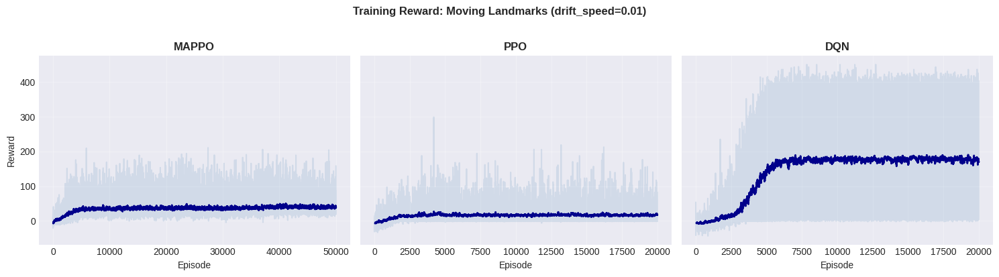

In [6]:
learning_curves = {}
if mappo_rewards: learning_curves["MAPPO"] = mappo_rewards
if ppo_rewards: learning_curves["PPO"] = ppo_rewards
if dqn_rewards: learning_curves["DQN"] = dqn_rewards

fig = plot_learning_curves(learning_curves, window=50, figsize=(15, 4))
plt.suptitle("Training Reward: Moving Landmarks (drift_speed=0.01)", fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

## 7. Policy Evaluation

Each policy is evaluated over 10 episodes using fixed random seeds for consistency.

- **`avg_coverage_mean`**: average number of landmarks covered per timestep (range: 0 to `n_landmarks`)
- **`efficiency_mean`**: fraction of timesteps where all landmarks are simultaneously covered

The random policy serves as the lower-bound baseline.

For historical context, the best V1 result (Sarsa(4), 0.31 on the static landmark task) is included in the summary table. However, it is not directly comparable to V2/final results due to a fundamental change in environment dynamics because V1 assumes static landmarks, whereas the final setup uses moving landmarks, making the task strictly harder and non-stationary.

In [7]:
all_policies = {
    "MAPPO":  (mappo_policy_fn(mappo_model), False),
    "PPO": (ppo_policy_fn(ppo_model), False),
    "DQN": (dqn_policy_fn(dqn_model), False),
    "Random": (lambda obs: None, False),
}

eval_metrics = {}
for name, (pfn, is_cont) in all_policies.items():
    eval_metrics[name] = evaluate_deep_policy(
        pfn,
        n_episodes=CONFIG["n_eval_episodes"],
        n_agents=CONFIG["n_agents"],
        n_landmarks=CONFIG["n_landmarks"],
        max_steps=CONFIG["max_steps"],
        cover_dist=CONFIG["cover_dist"],
        seed_start=CONFIG["eval_seed_start"],
        continuous_actions=is_cont,
        moving_landmarks=CONFIG["moving_landmarks"],
        drift_speed=CONFIG["drift_speed"],
    )

print(f"{'Method':<10} {'Avg Cov':>17} {'Efficiency':>17}")
for name, m in eval_metrics.items():
    print(f"{name:<10} "
          f"{m['avg_coverage_mean']:>7.3f}+/-{m['avg_coverage_std']:.3f}   "
          f"{m['efficiency_mean']:>6.1%}+/-{m['efficiency_std']:.1%}")

Method               Avg Cov        Efficiency
MAPPO        0.928+/-0.234    11.4%+/-21.8%
PPO          0.420+/-0.124     2.6%+/-5.9%
DQN          1.606+/-0.312    76.8%+/-18.4%
Random       0.124+/-0.160     0.2%+/-0.6%


## 8. Coverage Over Time

Per-step coverage during a representative rollout (seed 2026).

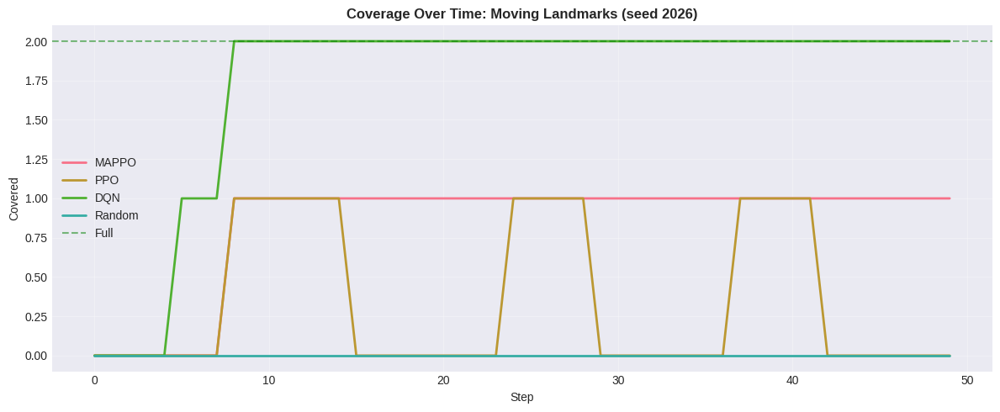

In [8]:
coverage_trajs = {}
for name, (pfn, is_cont) in all_policies.items():
    coverage_trajs[name] = collect_coverage_trajectory(
        pfn, 
        seed=2026,
        n_agents=CONFIG["n_agents"], 
        n_landmarks=CONFIG["n_landmarks"],
        max_steps=CONFIG["max_steps"], 
        cover_dist=CONFIG["cover_dist"],
        continuous_actions=is_cont,
        moving_landmarks=CONFIG["moving_landmarks"], 
        drift_speed=CONFIG["drift_speed"],
    )

fig, ax = plt.subplots(figsize=(12, 5))
plot_coverage_comparison_v2(coverage_trajs, n_landmarks=CONFIG["n_landmarks"], ax=ax)
ax.set_title("Coverage Over Time: Moving Landmarks (seed 2026)", fontweight="bold")
plt.tight_layout()
plt.show()

## 9. Ranked Comparison

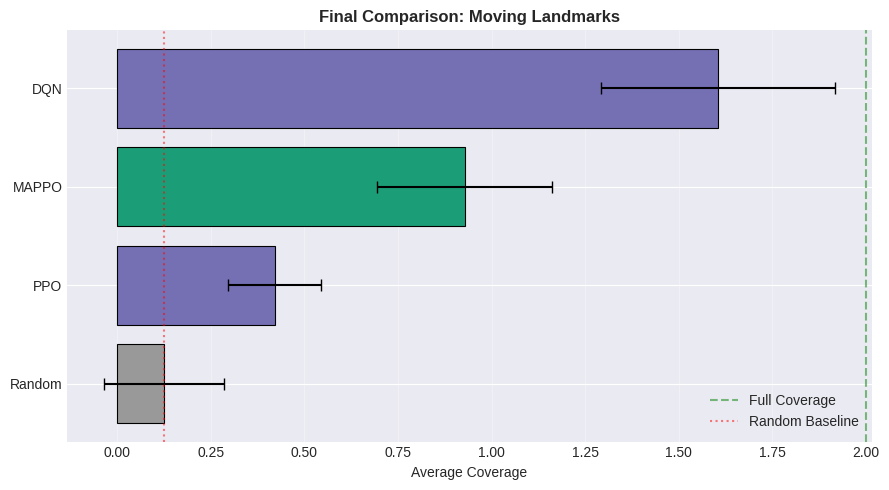


MAPPO vs PPO
Same actor architecture, centralized vs decentralized critic
  PPO score:   0.420
  MAPPO score: 0.928
  Improvement: 2.21x


In [9]:
ranked_methods = sorted(
    eval_metrics,
    key=lambda method: eval_metrics[method]["avg_coverage_mean"]
)

coverage_means = [
    eval_metrics[method]["avg_coverage_mean"]
    for method in ranked_methods
]

coverage_stds = [
    eval_metrics[method]["avg_coverage_std"]
    for method in ranked_methods
]

method_colors = {
    "Random": "#999999",
    "MAPPO": "#1b9e77",
    "PPO": "#7570b3",
}

bar_colors = [
    method_colors.get(method, "#7570b3")
    for method in ranked_methods
]

full_coverage_target = CONFIG["n_landmarks"]
random_baseline = eval_metrics["Random"]["avg_coverage_mean"]

fig, ax = plt.subplots(figsize=(9, 5))

ax.barh(
    ranked_methods,
    coverage_means,
    xerr=coverage_stds,
    color=bar_colors,
    edgecolor="black",
    linewidth=0.8,
    error_kw={"capsize": 4},
)

ax.axvline(
    full_coverage_target,
    linestyle="--",
    color="green",
    alpha=0.5,
    label="Full Coverage",
)

ax.axvline(
    random_baseline,
    linestyle=":",
    color="red",
    alpha=0.5,
    label="Random Baseline",
)
ax.set_xlabel("Average Coverage")
ax.set_title(
    "Final Comparison: Moving Landmarks",
    fontweight="bold",
)

ax.grid(True, axis="x", alpha=0.3)
ax.legend(loc="lower right")

plt.tight_layout()
plt.show()

if "PPO" in eval_metrics and "MAPPO" in eval_metrics:
    ppo_score = eval_metrics["PPO"]["avg_coverage_mean"]
    mappo_score = eval_metrics["MAPPO"]["avg_coverage_mean"]
    improvement_ratio = mappo_score / max(ppo_score, 1e-6)
    print("\nMAPPO vs PPO")
    print("Same actor architecture, centralized vs decentralized critic")
    print(f"  PPO score:   {ppo_score:.3f}")
    print(f"  MAPPO score: {mappo_score:.3f}")
    print(f"  Improvement: {improvement_ratio:.2f}x")

## 10. Trajectory Visualization

In [13]:
viz_seed = random.randint(0, 100000)
print(f"Using env seed {viz_seed} for all three methods\n")

for name, (pfn, is_cont) in all_policies.items():
    if "Random" in name:
        continue

    print(f"  {name}")

    viz = collect_rollout_auto(
        pfn,
        is_cont,
        seed=viz_seed,
        n_agents=CONFIG["n_agents"],
        n_landmarks=CONFIG["n_landmarks"],
        max_steps=CONFIG["max_steps"],
        moving_landmarks=CONFIG["moving_landmarks"],
        drift_speed=CONFIG["drift_speed"],
    )

    anim = animate_traj(viz, cover_dist=CONFIG["cover_dist"], interval_ms=150)
    display(HTML(anim.to_jshtml()))

Using env seed 14592 for all three methods

  MAPPO


  PPO


  DQN


## 11. Cross-Method Saliency

We compute gradient-based saliency to understand which parts of the observation each method relies on.

- **DQN:** saliency is computed by differentiating the maximum Q-value with respect to the input state.
- **PPO:** saliency is computed by differentiating the action distribution logits.
- **MAPPO:** saliency is computed from the centralized critic by differentiating the value output.

For each method, we aggregate the absolute gradient magnitude:
$$\left| \frac{\partial \text{output}}{\partial \text{input}} \right|$$

over many sampled states. This gives a stable estimate of which features the network consistently depends on.

We then group these contributions into four semantic categories:
- agent velocity
- agent self-position
- landmark relative positions
- other-agent relative positions

The resulting grouped bar chart shows how each method distributes its attention across these different parts of the observation space.

obs samples: 400, team states: 200


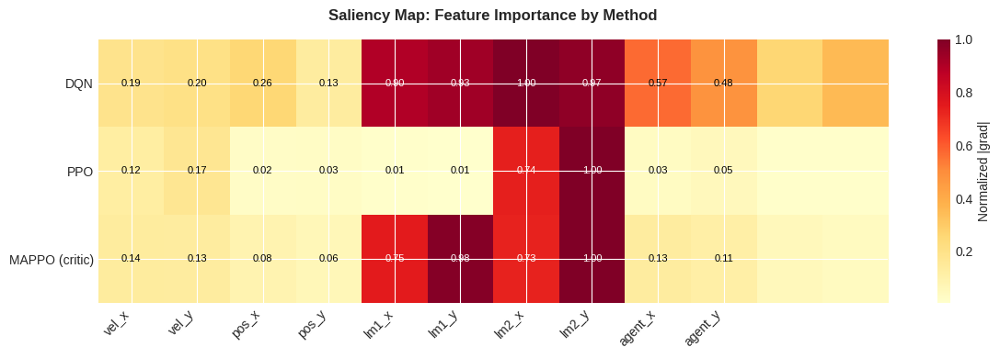

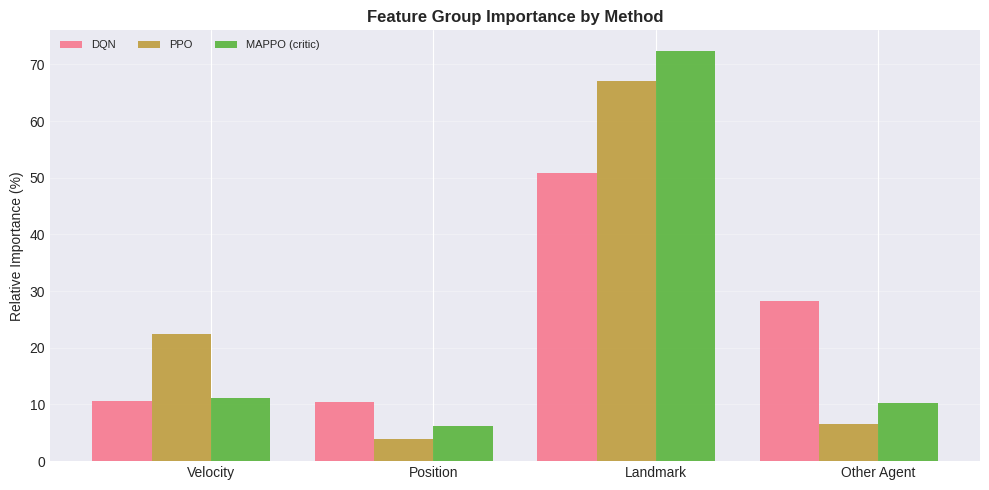

MAPPO centralized critic: mean saliency by group:
  landmark        4.8512
  velocity        0.7463
  other_agent     0.6897
  self_pos        0.4133
  communication   0.2666


In [11]:
obs_samples = []
team_states = sample_team_states(
    {"n_agents": CONFIG["n_agents"], "max_steps": CONFIG["max_steps"],
     "moving_landmarks": True, "drift_speed": CONFIG["drift_speed"]},
    n_samples=200,
)

obs_dim = mappo_info["obs_dim"]
n_agents = CONFIG["n_agents"]
for s in team_states:
    for a in range(n_agents):
        obs_samples.append(s[a * obs_dim : (a + 1) * obs_dim])
print(f"obs samples: {len(obs_samples)}, team states: {len(team_states)}")

saliencies = {}
saliencies["DQN"] = compute_saliency(dqn_model, obs_samples, method="dqn")
saliencies["PPO"] = compute_saliency(ppo_model, obs_samples, method="sb3_ac")

mappo_team_sal = compute_mappo_critic_saliency(mappo_model, team_states)
mappo_per_agent = mappo_team_sal.reshape(n_agents, obs_dim).mean(axis=0)
saliencies["MAPPO (critic)"] = mappo_per_agent

ax = plot_saliency_heatmap(saliencies)
plt.show()
ax = plot_grouped_importance(saliencies)
plt.show()

labels = mappo_team_obs_labels(obs_dim, n_agents=n_agents)
print("MAPPO centralized critic: mean saliency by group:")
for g, v in sorted(saliency_group_means(labels, mappo_team_sal).items(), key=lambda kv: -kv[1]):
    print(f"  {g:<15} {v:.4f}")

## 12. Model Persistence

In [12]:
CHECKPOINT_ROOT = PROJECT_ROOT / "notebooks" / "checkpoints"

mappo_path = CHECKPOINT_ROOT / "mappo" / "moving_landmarks" / "best" / "model.pt"
save_mappo(mappo_model, mappo_path, info=mappo_info)
print(f"MAPPO saved -> {mappo_path.relative_to(PROJECT_ROOT)}")

for name, model in [("ppo", ppo_model), ("dqn", dqn_model)]:
    p = CHECKPOINT_ROOT / name / "moving_landmarks" / "best"
    p.mkdir(parents=True, exist_ok=True)
    model.save(p / "model.zip")
    print(f"{name.upper()} saved -> {(p / 'model.zip').relative_to(PROJECT_ROOT)}")

MAPPO saved -> notebooks/checkpoints/mappo/moving_landmarks/best/model.pt
PPO saved -> notebooks/checkpoints/ppo/moving_landmarks/best/model.zip
DQN saved -> notebooks/checkpoints/dqn/moving_landmarks/best/model.zip


## 13. Discussion & Decisions

The assignment rubric explicitly asks not just *what* was implemented, but also *what wasn’t* and why. This section explains the main design decisions, tradeoffs, and lessons learned during the project.

### What I implemented and why

#### MAPPO (hand-rolled)
MAPPO was chosen as the main contribution beyond V2 because it is basically the smallest possible extension of PPO that still introduces centralized training with decentralized execution (CTDE). The actor network, PPO loss, and overall structure stayed almost identical to the V2 PPO implementation with the main difference being that the critic gets access to the global state during training.

That made the comparison much cleaner. Any improvement could mostly be attributed to the centralized critic rather than to changing to a completely different algorithm family.

#### Moving landmarks
Static landmarks were already mostly solved in V2, so the environment needed something harder. Adding drifting landmarks introduces non-stationarity directly into the task. This breaks the assumptions behind the empirical-MDP setup from V1 and forces the policies to continuously adapt.

The drift model uses persistent velocity with small angular noise and reflective walls. In practice this creates smooth, predictable movement rather than random Brownian motion, which means agents can potentially learn anticipation instead of pure reaction.

#### N-invariant reward shaping
The original V2 reward shaping was tuned around `N=2` agents and did not scale well to `N=3`. The issue was that some reward terms naturally increased with more landmarks while others stayed fixed.

The updated shaping normalizes the coverage terms so the maximum shaped reward per step stays roughly constant regardless of team size. For example:

```python
2.0 * (covered / n_landmarks)
```

This makes the environment much more scalable and avoids having to completely retune rewards every time the number of drones changes.

#### Per-agent contribution bonus
Early MAPPO experiments showed a pretty obvious “lazy agent” issue. Once one drone found a landmark, the other drone often stopped contributing because the shared team reward was already good enough.

To help with credit assignment, each agent received a small additional bonus when it was the closest drone covering a landmark. This made individual contributions visible to the policy gradient instead of relying entirely on shared team reward.

It helped, but didn’t completely solve coordination.

#### Generalized `reconstruct_positions`
A subtle bug in `aerocover.env_adapters.mpe_state` caused `reconstruct_positions` to only return the first two agents’ positions. With `N=2`, this happened to work fine. With `N=3`, the third drone was silently ignored.

The issue was only discovered after training runs when the third drone was missing from animations. The function was updated to properly support arbitrary team sizes.

#### PPO and DQN retrained on moving landmarks
Instead of loading the old V2 checkpoints, PPO and DQN were retrained directly on the moving-landmark environment.

Using the old checkpoints would mostly measure out-of-distribution generalization rather than actual within-task performance. Retraining isolates the architectural differences more cleanly.

#### Cross-method saliency
A shared saliency pipeline was added so DQN, PPO, and MAPPO could all be analyzed with the same visualization tools. This ended up being useful infrastructure beyond just this version of the project.

---

### What I deliberately didn’t implement

#### MADDPG
In hindsight, MADDPG may actually have been the stronger algorithmic choice.

The main issue encountered with MAPPO was credit assignment because of the “lazy agent” behavior where one drone stops helping once the team reward becomes acceptable. MADDPG’s per-agent critics naturally address this problem without needing custom reward shaping.

MADDPG is also off-policy with replay buffers, which usually handles non-stationary environments better. DQN’s surprisingly strong performance suggests this mattered a lot here.

Still, MAPPO was chosen because it was the cleanest extension of the existing PPO baseline. That made the comparison easier to defend academically. If starting over from scratch, though, MADDPG would probably be the better future direction.

#### Graph neural networks
GNNs are probably the correct long-term architecture for variable-size teams because they are permutation equivariant by design.

The problem is that with only `N=2` agents, those advantages are basically invisible. Adding GNNs here would also introduce a second major experimental variable on top of moving landmarks, making it hard to tell whether improvements came from the centralized critic or the architecture itself.

For this project, keeping the architecture simple made the comparisons easier to interpret.

#### Communication channels
Explicit inter-agent communication was considered but ultimately didn’t make much sense in this environment.

Agents already observe every landmark and every other drone directly, so there is very little hidden information to communicate. Learnable messaging would add complexity without solving a real bottleneck.

#### Optimizer experimentation
Alternative optimizers like Muon or Lookahead were briefly considered but rejected.

Muon is mostly designed around attention-heavy architectures and orthogonal weight updates, while these models are just small 2-layer MLPs. More importantly, changing optimizers this late would have confounded the experiment because improvements would become ambiguous between “better optimizer” and “better algorithm.”

#### BenchMARL comparison
A second MAPPO implementation using BenchMARL was originally planned.

That ended up getting cut because TorchRL’s `PettingZooEnv` wrapper does not properly inherit custom `BaseParallelWrapper`s like `MovingLandmarksWrapper`. A fair comparison would have required writing a custom task wrapper from scratch.

Given the time budget, it made more sense to focus on one solid MAPPO implementation with better analysis tooling.

#### Multi-seed confidence intervals
A more rigorous comparison would run each method across multiple random seeds and report confidence intervals.

For practical reasons, the experiments here use one seed per method to keep runtime manageable. The results are still useful for comparison, but they should be treated as suggestive rather than statistically definitive.

---

### Reading the results

The three methods ended up producing noticeably different behaviors, and those behaviors matched the training curves surprisingly well.

#### MAPPO
MAPPO learned partial coordination.

Typically, one drone would reliably move toward and hold a landmark, while the second drone hovered nearby but did not consistently commit to covering the remaining target. The contribution bonus removed the worst version of this failure mode which was where the second drone completely gave up, but coordination still remained incomplete.

This likely comes from the shared actor setup. Since both agents share the same policy network, similar observations tend to produce similar actions. There is no strong mechanism encouraging specialization.

#### PPO
PPO produced the least coherent behavior overall.

Both drones moved around actively, but neither settled into a stable strategy. With decentralized critics and on-policy updates, the value estimates became noisy under the layered non-stationarity of drifting landmarks plus changing teammate policies.

The result was weaker coverage and less stable learning compared to MAPPO.

#### DQN
DQN consistently produced the cleanest tracking behavior.

The drones quickly moved toward landmarks and maintained coverage even as the landmarks drifted. Replay buffers and off-policy learning seem to fit this task especially well because successful behaviors can be reused many times during training.

Despite being the least “fancy” method in the project, DQN ended up being the strongest performer on actual coverage.

---

### Limitations

- **Single-seed experiments.** More seeds would improve statistical reliability, but each additional seed adds a large training cost.

- **Limited hyperparameter tuning.** PPO and DQN mostly reuse V2 settings for consistency, while MAPPO uses similar values. A fully fair comparison would tune each method separately.

- **Reward shaping became somewhat task-specific.** The contribution bonus effectively encodes the assumption that agents should split up and cover separate landmarks. A method like MADDPG would ideally learn this behavior directly.

- **Training budget limitations.** The original MAPPO paper often trains for 5–10 million steps on environments like `simple_spread`. MAPPO here used 5M steps, while PPO and DQN used 1M to stay comparable with V2. Longer training might improve MAPPO further or it might jusut confirm that performance plateaus at this scale.

## 14. Conclusion

This final project extended the V2 system with a hand-rolled MAPPO implementation, drifting landmarks, scalable reward shaping, and a per-agent contribution bonus designed to reduce the lazy-agent coordination problem.

MAPPO was able to produce partial coordination between drones, but it still struggled to consistently get both agents actively engaged with separate landmarks at the same time. PPO generally performed worse, producing less stable and less coherent cooperative behavior under the added non-stationarity of moving targets and changing teammate policies.

Interestingly, DQN ended up achieving the strongest overall coverage performance despite being the least sophisticated algorithm in the project. The combination of replay buffers, off-policy learning, and dense reward shaping matched this task surprisingly well and produced the most reliable tracking behavior across evaluations.

One of the biggest takeaways from the project was how important credit assignment becomes in cooperative multi-agent settings. A large amount of the MAPPO work ultimately focused on trying to encourage specialization between agents rather than simply improving raw reward.

With hindsight, MADDPG would likely have been a stronger algorithmic direction. Its per-agent critics naturally address credit assignment problems without needing as much custom reward shaping, and its off-policy training setup is generally better suited for non-stationary environments like moving-landmark coverage. That makes MADDPG the most natural next step for future work.

Beyond that, graph neural network critics are probably the clearest architectural extension for scaling beyond small fixed team sizes, since they can naturally handle variable numbers of agents and landmarks without requiring manually structured state representations.

## References

**Algorithms:**
- Bellman, R. (1957). *Dynamic Programming*. Princeton University Press.
- Sutton, R. S. & Barto, A. G. (2018). *Reinforcement Learning: An Introduction* (2nd ed.). MIT Press.
- Mnih et al. (2015). Human-level control through deep reinforcement learning. *Nature* 518.
- Schulman et al. (2016). High-Dimensional Continuous Control Using Generalized Advantage Estimation. *arXiv:1506.02438*.
- Schulman et al. (2017). Proximal Policy Optimization Algorithms. *arXiv:1707.06347*.
- Lowe et al. (2017). Multi-Agent Actor-Critic for Mixed Cooperative-Competitive Environments. *NeurIPS 2017*. (MADDPG, foundational CTDE work)
- Foerster et al. (2018). Counterfactual Multi-Agent Policy Gradients. *AAAI 2018*. (COMA)
- Yu et al. (2022). The Surprising Effectiveness of PPO in Cooperative Multi-Agent Games. *NeurIPS Datasets and Benchmarks*. (MAPPO)

**Libraries:**
- Raffin et al. (2021). Stable-Baselines3. *JMLR* 22(268).
- Terry et al. (2021). PettingZoo: Gym for Multi-Agent Reinforcement Learning. *NeurIPS 2021*.
- Mordatch & Abbeel (2018). Emergence of Grounded Compositional Language in Multi-Agent Populations. *AAAI 2018*. (MPE environments)
- SuperSuit (PettingZoo wrapper library).

**Tools:** Python 3.12, PyTorch, NumPy, Matplotlib, Seaborn, PettingZoo, Stable-Baselines3, SuperSuit

**Collaborators:** Discussion with course peers on reward shaping approaches.

**AI Assistance:** Claude (Anthropic) used for code review, MAPPO patches, notebook scaffolding, and documentation.